<a href="https://colab.research.google.com/github/MthabisiPatrice/Machine-Learning-/blob/main/Housing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Libraries
import xgboost as xgb
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from matplotlib import pyplot as plt
import seaborn as sns
from xgboost import XGBRegressor
from sklearn import tree
from sklearn.metrics import mean_squared_error
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score, r2_score
import altair as alt
from geopy.distance import geodesic
import math



In [ ]:
# New data set to be merged with a left join INCOME DATA

income = pd.read_csv('/content/external_data.csv', encoding='ISO-8859-1')
# or try 'cp1252' if 'ISO-8859-1' doesn't work
# icncome = pd.read_csv('/content/external data.csv', encoding='cp1252')

income['zip'] = income['zip'].str.replace('Ê', '')
income['zip'] = income['zip'].astype(int)
#income.head()
income.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 572 entries, 0 to 571
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   zip           572 non-null    int64
 1   Income        572 non-null    int64
 2   heating_Cost  572 non-null    int64
 3   median_price  572 non-null    int64
 4   population    572 non-null    int64
dtypes: int64(5)
memory usage: 22.5 KB


In [ ]:
# MAIN DATASET

import pandas as pd
housing = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/housing.csv')
housing.head(20)

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,1565930130,20141104T000000,4,3.25,3760,4675,2.0,0,0,3,...,2740,1020,2007,0,98038,47.3862,-122.048,3280,4033,429900.0
1,3279000420,20150115T000000,3,1.75,1460,7800,1.0,0,0,2,...,1040,420,1979,0,98023,47.3035,-122.382,1310,7865,233000.0
2,194000575,20141014T000000,4,1.00,1340,5800,1.5,0,2,3,...,1340,0,1914,0,98116,47.5658,-122.389,1900,5800,455000.0
3,2115510160,20141208T000000,3,1.75,1440,8050,1.0,0,0,3,...,1440,0,1985,0,98023,47.3187,-122.390,1790,7488,258950.0
4,7522500005,20140815T000000,2,1.50,1780,4750,1.0,0,0,4,...,1080,700,1947,0,98117,47.6859,-122.395,1690,5962,555000.0
5,3787000140,20140901T000000,3,2.25,1780,9969,1.0,0,0,3,...,1450,330,1985,0,98034,47.7286,-122.168,1950,7974,450000.0
6,7852110690,20140522T000000,4,2.50,2980,8107,2.0,0,0,3,...,2980,0,2000,0,98065,47.5389,-121.876,2750,7760,622500.0
7,5469700260,20140903T000000,4,2.25,2530,24700,2.0,0,0,3,...,2530,0,1974,0,98031,47.3939,-122.177,2650,24700,340000.0
8,8691410730,20150220T000000,4,2.50,3090,5600,2.0,0,0,3,...,3090,0,2005,0,98075,47.5970,-121.979,3080,5788,708000.0
9,114100763,20140728T000000,3,0.75,1040,15000,1.0,0,0,3,...,1040,0,1941,0,98028,47.7639,-122.234,1410,19000,230000.0


In [ ]:
#MERGING THE DATASET
import pandas as pd

# Perform the left join
merged_df = housing.merge(income, left_on='zipcode', right_on='zip', how='left')

# Drop the 'zip' column from the income dataset to avoid duplication
merged_df = merged_df.drop(columns=['zip'])

# Display the first few rows of the merged dataset
merged_df.head()




,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,zipcode,lat,long,sqft_living15,sqft_lot15,price,Income,heating_Cost,median_price,population
0,1565930130,20141104T000000,4,3.25,3760,4675,2.0,0,0,3,...,98038,47.3862,-122.048,3280,4033,429900.0,93573,142,468000,45555
1,3279000420,20150115T000000,3,1.75,1460,7800,1.0,0,0,2,...,98023,47.3035,-122.382,1310,7865,233000.0,67881,140,303000,50778
2,194000575,20141014T000000,4,1.00,1340,5800,1.5,0,2,3,...,98116,47.5658,-122.389,1900,5800,455000.0,73667,147,622000,35618
3,2115510160,20141208T000000,3,1.75,1440,8050,1.0,0,0,3,...,98023,47.3187,-122.390,1790,7488,258950.0,67881,140,303000,50778
4,7522500005,20140815T000000,2,1.50,1780,4750,1.0,0,0,4,...,98117,47.6859,-122.395,1690,5962,555000.0,91199,146,644000,35551


In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             20000 non-null  int64  
 1   date           20000 non-null  object 
 2   bedrooms       20000 non-null  int64  
 3   bathrooms      20000 non-null  float64
 4   sqft_living    20000 non-null  int64  
 5   sqft_lot       20000 non-null  int64  
 6   floors         20000 non-null  float64
 7   waterfront     20000 non-null  int64  
 8   view           20000 non-null  int64  
 9   condition      20000 non-null  int64  
 10  grade          20000 non-null  int64  
 11  sqft_above     20000 non-null  int64  
 12  sqft_basement  20000 non-null  int64  
 13  yr_built       20000 non-null  int64  
 14  yr_renovated   20000 non-null  int64  
 15  zipcode        20000 non-null  int64  
 16  lat            20000 non-null  float64
 17  long           20000 non-null  float64
 18  sqft_l

Now we have to work on the collumns and fix them so we can work with them.

In [ ]:

def split_date(date_str):
    year = int(date_str[:4])
    month = int(date_str[4:6])
    return pd.Series([year, month])

#making new colllumns
merged_df[['Sale_Year', 'Sale_Month']] = merged_df['date'].apply(split_date)

#Drop the 'date' column
merged_df.drop('date', axis=1, inplace=True)




Now we get the location names.


In [ ]:
merged_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             20000 non-null  int64  
 1   bedrooms       20000 non-null  int64  
 2   bathrooms      20000 non-null  float64
 3   sqft_living    20000 non-null  int64  
 4   sqft_lot       20000 non-null  int64  
 5   floors         20000 non-null  float64
 6   waterfront     20000 non-null  int64  
 7   view           20000 non-null  int64  
 8   condition      20000 non-null  int64  
 9   grade          20000 non-null  int64  
 10  sqft_above     20000 non-null  int64  
 11  sqft_basement  20000 non-null  int64  
 12  yr_built       20000 non-null  int64  
 13  yr_renovated   20000 non-null  int64  
 14  zipcode        20000 non-null  int64  
 15  lat            20000 non-null  float64
 16  long           20000 non-null  float64
 17  sqft_living15  20000 non-null  int64  
 18  sqft_l

In [ ]:
landmarks = {
    'city_center': (47.6062, -122.3321),
    'lake_washington': (47.6120, -122.2828),
    'seattle_center': (47.6205, -122.3493),
    'medina': (47.6204, -122.2416),
}
def add_distance_to_landmarks(merged_df, landmarks):
    for landmark, coords in landmarks.items():
        merged_df[f'distance_to_{landmark}'] = merged_df.apply(lambda row: geodesic(coords, (row['lat'], row['long'])).miles, axis=1)
    return merged_df
# Add distances to the dataset
merged_df = add_distance_to_landmarks(merged_df, landmarks)

In [ ]:
import pandas as pd
import numpy as np

def engineer_features(df):
    # Age of the house
    df['house_age'] = df['Sale_Year'] - df['yr_built']

    # Time since renovation
    df['time_since_renovation'] = np.where(df['yr_renovated'] != 0,
                                           df['Sale_Year'] - df['yr_renovated'],
                                           df['house_age'])

    # Total square footage
    df['total_sqft'] = df['sqft_living'] + df['sqft_basement']

    # Price per square foot
    df['price_per_sqft'] = df['median_price'] / (df['total_sqft']+1)

    # Lot utilization
    df['lot_utilization'] = df['sqft_living'] / (df['sqft_lot']+1)

    # Bathroom to bedroom ratio
    df['bath_bed_ratio'] = df['bathrooms'] / (df['bedrooms']+1)

    # Income to price ratio (affordability metric)
    df['affordability'] = df['Income'] / (df['median_price']+1)

    # Heating efficiency
    df['heating_efficiency'] = df['heating_Cost'] / (df['sqft_living']+1)

    return df

# Apply feature engineering to merged_df
merged_df = engineer_features(merged_df)

# Print the first few rows of the new columns to verify
print(merged_df[['house_age', 'time_since_renovation', 'total_sqft',
                 'lot_utilization', 'bath_bed_ratio',"price_per_sqft","affordability"
                 ,'heating_efficiency']].head())

# Print info about the updated DataFrame
#print(merged_df.info())
merged_df.info()

   house_age  time_since_renovation  total_sqft  lot_utilization  \
0          7                      7        4780         0.804106   
1         36                     36        1880         0.187155   
2        100                    100        1340         0.230995   
3         29                     29        1440         0.178860   
4         67                     67        2480         0.374658   

   bath_bed_ratio  price_per_sqft  affordability  heating_efficiency  
0          0.6500       97.887471       0.199942            0.037756  
1          0.4375      161.084530       0.224029            0.095825  
2          0.2000      463.832960       0.118436            0.109620  
3          0.4375      210.270645       0.224029            0.097155  
4          0.5000      259.572753       0.141613            0.081976  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype 

In [ ]:
# Get our target variable and features and split them into test and train datasets
X = merged_df.drop(columns=['price'])



y = merged_df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
#comments on the side are there to help me know exactly what I am doing and the impact that has.
xg_reg = xgb.XGBRegressor(
    objective='reg:squarederror',
    colsample_bytree=0.5,   # Increased from 0.3 for more features per tree
    learning_rate=0.1,     # Lower learning rate for better generalization
    max_depth=4,            # A slightly deeper tree for more complex patterns
    alpha=2,                # Reduced regularization for less penalization
    n_estimators=850,       # Increased to accommodate the lower learning rate
    subsample=0.8,          # Randomly sample 80% of data per tree for more variety
    min_child_weight=5,     # Higher value to control tree size and avoid overfitting
    gamma=2                 # Conservative tree splits
)

# Train the model

xg_reg.fit(X_train, y_train)

XGBRegressor(alpha=2, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.5, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=2, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=850, n_jobs=None,
             num_parallel_tree=None, ...)

In [ ]:
#make the predictions
predictions = xg_reg.predict(X_test)

In [ ]:

columns = X.columns.tolist()

#  feature_importances from my  trained  little model
feature_importances_one = np.around(xg_reg.feature_importances_, 4)

# Create a DataFrame to store feature names and their importance values
feature_importance_one = pd.DataFrame({'Feature': columns, 'Importance': feature_importances_one})

# Sort the DataFrame by importance values in descending order
feature_importance_one = feature_importance_one.sort_values(by='Importance', ascending=False)

# Display the top 10 features
top_importance = feature_importance_one.head(10)
print(top_importance)

# Visualize with Altair
import altair as alt

# Bar chart showing the top 10 most important features
alt.Chart(top_importance, title='Most Important Features').mark_bar().encode(
    y=alt.Y('Feature:N', sort='-x', title='Feature'),  # Sort features by importance
    x=alt.X('Importance:Q', title='Importance')  # Quantitative axis for importance
).properties(
    width=400,  # Increased width for readability
    height=350
)


                        Feature  Importance
9                         grade      0.2683
21                 median_price      0.1140
36           heating_efficiency      0.0855
6                    waterfront      0.0774
3                   sqft_living      0.0571
31                   total_sqft      0.0538
7                          view      0.0480
27   distance_to_seattle_center      0.0347
28           distance_to_medina      0.0329
26  distance_to_lake_washington      0.0286


/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [ ]:
import altair as alt
import pandas as pd

# Sample 5000 rows from the dataset
sampled_data = merged_df.sample(5000)

# Create a scatter plot of median_price vs. average_income with sampled data
scatter_plot = alt.Chart(sampled_data).mark_point().encode(
    x=alt.X('Income:Q', title='Average Income'),
    y=alt.Y('median_price:Q', title='Median Price'),
    tooltip=['Income', 'median_price']
).properties(
    title='Scatter Plot of Median Price vs. Average Income',
    width=400,
    height=300
)

# Display the chart
scatter_plot


alt.Chart(...)

In [ ]:


import altair as alt

# Assuming merged_df is already loaded as a DataFrame
# Sample 500 rows from the dataset for plotting
sampled_df = merged_df.sample(200)

# Create a scatter plot using Altair
chart = alt.Chart(sampled_df).mark_circle(size=60).encode(
    x='total_sqft',
    y='price',
    tooltip=['total_sqft', 'price']
).properties(
    title='Relation between Price and Total Sqft'
)

# Display the chart
chart


alt.Chart(...)

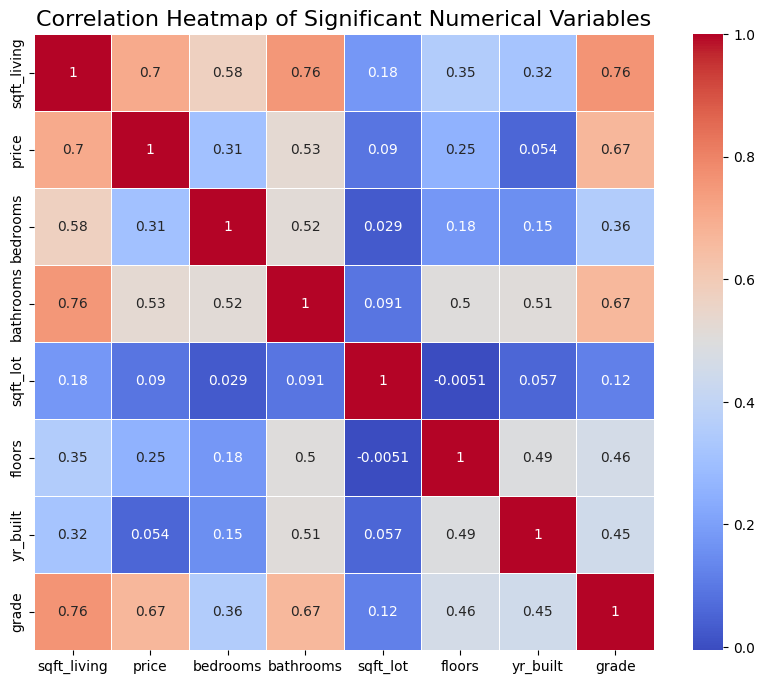

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select the most significant numerical variables for correlation analysis
significant_columns = ['sqft_living', 'price', 'bedrooms', 'bathrooms', 'sqft_lot', 'floors', 'yr_built', 'grade']

# Create a new DataFrame with only the significant columns
significant_data = merged_df[significant_columns]

# Compute the correlation matrix
corr_matrix = significant_data.corr()

# Plot the heatmap using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)

# Add title and display the heatmap
plt.title('Correlation Heatmap of Significant Numerical Variables', fontsize=16)
plt.show()


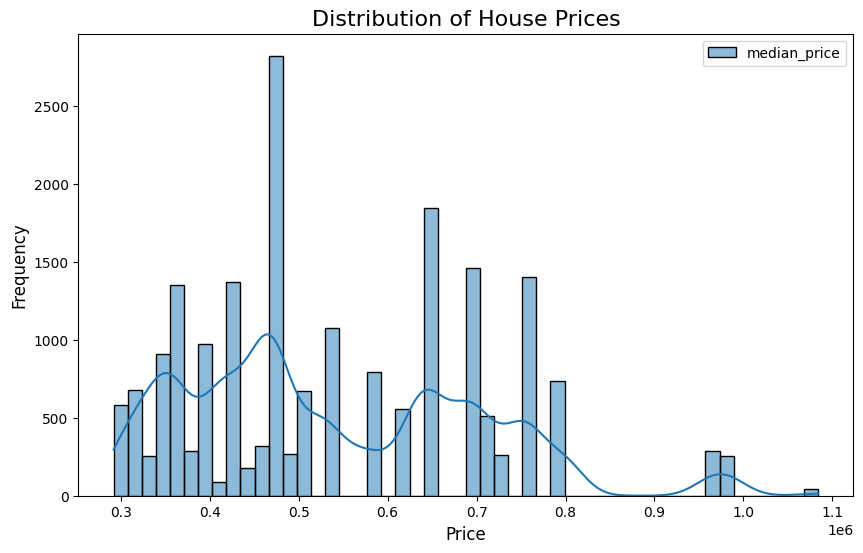

In [ ]:
plt.figure(figsize=(10, 6))

# Use seaborn's histogram function for better aesthetics
sns.histplot(merged_df[['median_price']], bins=50, kde=True, color='skyblue')  # 'price' is the column for house prices

# Add labels and title
plt.title('Distribution of House Prices', fontsize=16)
plt.xlabel('Price', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Show the plot
plt.show()

In [ ]:

import folium
import pandas as pd
import branca

# Assuming your dataset is called 'merged_data' and contains 'lat', 'long', and 'price' columns
# Filter the dataset to only include houses with prices greater than $800,000 and less than $2,000,000
filtered_data = merged_df[(merged_df['price'] > 800000) & (merged_df['price'] < 5000000)]

# Create a base map centered around Seattle
map_center = [47.6062, -122.3321]  # Latitude and longitude of Seattle
seattle_map = folium.Map(location=map_center, zoom_start=12)

# Create a color scale based on the price
min_price = filtered_data['price'].min()
max_price = filtered_data['price'].max()
colormap = branca.colormap.LinearColormap(
    colors=['blue', 'green', 'yellow', 'red'],  # Define your color gradient here
    vmin=min_price,
    vmax=max_price
)

# Loop through the filtered_data DataFrame and add CircleMarkers
for _, row in filtered_data.iterrows():
    folium.CircleMarker(
        location=(row['lat'], row['long']),  # Referencing 'lat' and 'long' columns
        radius=5,  # You can adjust the radius as needed
        color=None,  # No border color, makes the circle appear without an outline
        fill=True,
        fill_opacity=0.6,
        fill_color=colormap(row['price']),  # Use the color gradient based on price
        popup=f"Price: ${row['price']:,}"  # Display price on hover
    ).add_to(seattle_map)

# Add the colormap to the map for reference
colormap.add_to(seattle_map)

# Save the map to an HTML file
#seattle_map.save('seattle_house_prices_800k_to_2M_map.html')

# To display the map directly in a Jupyter Notebook, uncomment the line below:
seattle_map



In [ ]:
# Compute the Root Mean Squared Error of the predictions
rmse = np.sqrt(mean_squared_error(y_test, predictions))
print(f"Root Mean Squared Error (RMSE): {rmse}")

Root Mean Squared Error (RMSE): 122929.54376198801


In [ ]:
from sklearn.metrics import r2_score

rsquared = r2_score(y_test, predictions)
print(f"R-squared: {rsquared}")


R-squared: 0.8998021714742034


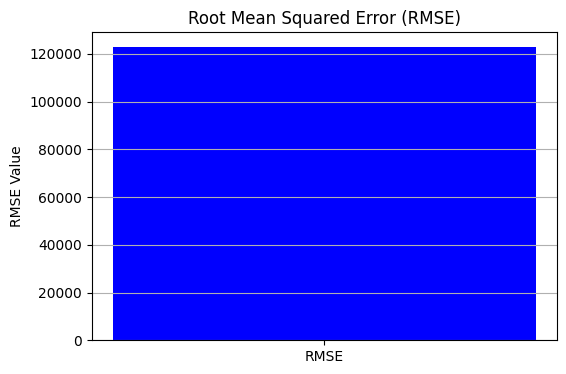

In [ ]:
import matplotlib.pyplot as plt

# RMSE value from your calculations
rmse = 122929.54  # Replace with your actual RMSE

# Create a bar chart
plt.figure(figsize=(6, 4))
plt.bar(['RMSE'], [rmse], color='blue')

# Add title and labels
plt.title('Root Mean Squared Error (RMSE)')
plt.ylabel('RMSE Value')

# Display the plot
plt.grid(axis='y')
plt.show()


In [ ]:
import altair as alt

# Sample 5000 rows from the dataset to avoid the MaxRowsError
sampled_df = merged_df.sample(n=5000, random_state=42)

# Create a box plot with the sampled data
boxplot = alt.Chart(sampled_df).mark_boxplot().encode(
    x=alt.X('grade:O', title='Grade'),  # Grade on the X-axis
    y=alt.Y('median_price:Q', title='Median Price')  # Median price on the Y-axis
).properties(
    title='Box Plot of Median Price by Grade',
    width=600,
    height=400
)

# Display the box plot
boxplot



alt.Chart(...)

In [ ]:
import plotly.express as px

px.scatter(x=predictions,y=y_test, trendline="ols")

In [ ]:
import pandas as pd

mini = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/housing_holdout_test.csv')
mini.head()
mini.shape[0]

1613

In [ ]:
#MINI HOLDOUT
import pandas as pd

mini = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/housing_holdout_test.csv')
mini.head()


#MERGING THE DATASET

# Perform the left join
merged_2 = mini.merge(income, left_on='zipcode', right_on='zip', how='left')

# Drop the 'zip' column from the income dataset to avoid duplication
merged_2 = merged_2.drop(columns=['zip'])

# Display the first few rows of the merged dataset
merged_2.head()



,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,Income,heating_Cost,median_price,population
0,2591820310,20141006T000000,4,2.25,2070,8893,2.0,0,0,4,...,0,98058,47.4388,-122.162,2390,7700,81221,138,402000,40425
1,7974200820,20140821T000000,5,3.00,2900,6730,1.0,0,0,5,...,0,98115,47.6784,-122.285,2370,6283,88633,146,644000,35842
2,7701450110,20140815T000000,4,2.50,3770,10893,2.0,0,2,3,...,0,98006,47.5646,-122.129,3710,9685,111216,148,754000,58172
3,9522300010,20150331T000000,3,3.50,4560,14608,2.0,0,2,3,...,0,98034,47.6995,-122.228,4050,14226,81037,146,534000,46117
4,9510861140,20140714T000000,3,2.50,2550,5376,2.0,0,0,3,...,0,98052,47.6647,-122.083,2250,4050,103086,153,754000,41849


In [ ]:
merged_2.shape[0]

1613

In [ ]:
#Merge 2 splitting Year collumn


def split_date(date_str):
    year = int(date_str[:4])
    month = int(date_str[4:6])
    return pd.Series([year, month])

#making new colllumns
merged_2[['Sale_Year', 'Sale_Month']] = merged_2['date'].apply(split_date)

#Drop the 'date' column
merged_2.drop('date', axis=1, inplace=True)

merged_2.shape[0]

#merged_2.head()

1613

In [ ]:
merged_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1613 entries, 0 to 1612
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             1613 non-null   int64  
 1   bedrooms       1613 non-null   int64  
 2   bathrooms      1613 non-null   float64
 3   sqft_living    1613 non-null   int64  
 4   sqft_lot       1613 non-null   int64  
 5   floors         1613 non-null   float64
 6   waterfront     1613 non-null   int64  
 7   view           1613 non-null   int64  
 8   condition      1613 non-null   int64  
 9   grade          1613 non-null   int64  
 10  sqft_above     1613 non-null   int64  
 11  sqft_basement  1613 non-null   int64  
 12  yr_built       1613 non-null   int64  
 13  yr_renovated   1613 non-null   int64  
 14  zipcode        1613 non-null   int64  
 15  lat            1613 non-null   float64
 16  long           1613 non-null   float64
 17  sqft_living15  1613 non-null   int64  
 18  sqft_lot

In [ ]:
import pandas as pd
import numpy as np

def engineer_features(df2):
    # Age of the house
    df2['house_age'] = df2['Sale_Year'] - df2['yr_built']

    # Time since renovation
    df2['time_since_renovation'] = np.where(df2['yr_renovated'] != 0,
                                            df2['Sale_Year'] - df2['yr_renovated'],
                                            df2['house_age'])

    # Total square footage
    df2['total_sqft'] = df2['sqft_living'] + df2['sqft_basement']

    # Price per square foot
    df2['price_per_sqft'] = df2['median_price'] / (df2['total_sqft'] + 1)

    # Lot utilization
    df2['lot_utilization'] = df2['sqft_living'] / (df2['sqft_lot'] + 1)

    # Bathroom to bedroom ratio
    df2['bath_bed_ratio'] = df2['bathrooms'] / (df2['bedrooms'] + 1)

    # Income to price ratio (affordability metric)
    df2['affordability'] = df2['Income'] / (df2['median_price'] + 1)

    # Heating efficiency
    df2['heating_efficiency'] = df2['heating_Cost'] / (df2['sqft_living'] + 1)

    return df2

# Apply feature engineering to merged_df
merged_3 = engineer_features(merged_2)

# Print the first few rows of the new columns to verify
print(merged_3[['house_age', 'time_since_renovation', 'total_sqft', 'price_per_sqft',
                 'lot_utilization', 'bath_bed_ratio', 'affordability', 'heating_efficiency']].head())

# Print info about the updated DataFrame
merged_3.info()
merged_3.shape[0]

   house_age  time_since_renovation  total_sqft  price_per_sqft  \
0         28                     28        2070      194.109126   
1         37                     37        3970      162.175774   
2         17                     17        3770      199.946964   
3         25                     25        4560      117.079588   
4         10                     10        2550      295.570365   

   lot_utilization  bath_bed_ratio  affordability  heating_efficiency  
0         0.232741           0.450       0.202042            0.066634  
1         0.430842           0.500       0.137629            0.050327  
2         0.346062           0.500       0.147501            0.039247  
3         0.312136           0.875       0.151754            0.032011  
4         0.474242           0.625       0.136719            0.059976  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1613 entries, 0 to 1612
Data columns (total 33 columns):
 #   Column                 Non-Null Count  Dtype  
---  -

1613

In [ ]:
# Check the data types of the merged DataFrame
print(merged_2.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1613 entries, 0 to 1612
Data columns (total 33 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     1613 non-null   int64  
 1   bedrooms               1613 non-null   int64  
 2   bathrooms              1613 non-null   float64
 3   sqft_living            1613 non-null   int64  
 4   sqft_lot               1613 non-null   int64  
 5   floors                 1613 non-null   float64
 6   waterfront             1613 non-null   int64  
 7   view                   1613 non-null   int64  
 8   condition              1613 non-null   int64  
 9   grade                  1613 non-null   int64  
 10  sqft_above             1613 non-null   int64  
 11  sqft_basement          1613 non-null   int64  
 12  yr_built               1613 non-null   int64  
 13  yr_renovated           1613 non-null   int64  
 14  zipcode                1613 non-null   int64  
 15  lat 

In [ ]:
X = merged_2[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront',
    'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated',
    'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'Income', 'heating_Cost',
    'median_price', 'Sale_Year', 'house_age', 'time_since_renovation',
    'total_sqft', 'price_per_sqft', "population",'lot_utilization', 'affordability',
    'heating_efficiency'
]]

In [ ]:
predictions = xg_reg.predict(X)

In [ ]:
predictions

array([ 389490.38,  876849.2 , 1187673.1 , ...,  292022.06, 1352362.1 ,
        333750.78], dtype=float32)

In [ ]:
#create CSV
predictions = pd.DataFrame(predictions)
predictions.to_csv('team3_pred.csv', index=False)